In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, sys

In [2]:
project_root = '/user_data/mmhender/featsynth/'
local_image_folder = '/user_data/mmhender/stimuli/featsynth/images_v1/'


In [3]:
expt_name = 'pilot2'

data_folder = os.path.join(project_root, 'online_data', expt_name)
expt_design_folder = os.path.join(project_root, 'expt_design', expt_name)

In [6]:
super_names_eachset = []
basic_names_eachset = []
info_eachset = []

for which_cb in [1,2]:
    info_filename = os.path.join(expt_design_folder, 'trial_info_counterbal%d.csv'%which_cb)
    info = pd.read_csv(info_filename)
    
    super_names = np.unique(info['super_name'])
    basic_names = []
    for sup in super_names:
        basic = np.unique(np.array(info['basic_name'][info['super_name']==sup]))
        basic_names += [basic]
        
    super_names_eachset += [super_names]    
    basic_names_eachset += [basic_names]
    
    info_eachset += [info]
    
    names = info['image_name']

    image_paths_full = []

    for name in names:

        # subfolder = name.
        # if 'grid' in name:
        #     subfolder = name.split('_grid')[0]
        # else:
        #     subfolder = name.split('_orig')[0]
        # filename = name.split(subfolder+'_')[1]

        path = os.path.join(local_image_folder, name)

        image_paths_full += [path]
    
    info['image_path_full'] = image_paths_full
    
n_supcat = len(super_names_eachset[0])
n_bascat = len(basic_names_eachset[0][0])
n_supcat, n_bascat

(10, 10)

In [7]:
cue_level_vals = np.unique(info['cue_level'])
n_cue_levels = len(cue_level_vals)

image_type_vals = np.unique(info['image_type_num'])
n_image_types = len(image_type_vals)


In [8]:
n_image_types

5

In [9]:
info.keys()

Index(['trial_num_overall', 'categ_ind', 'concept_ind', 'super_name',
       'basic_name', 'ex_num', 'image_type_num', 'image_type', 'image_name',
       'dropbox_url', 'target_present', 'cue_level_num', 'cue_level',
       'cue_name', 'run_number', 'trial_in_run', 'image_path_full'],
      dtype='object')

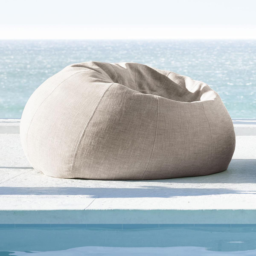

In [15]:
import PIL
PIL.Image.open(image_paths_full[0])

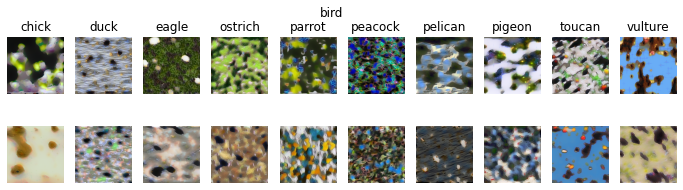

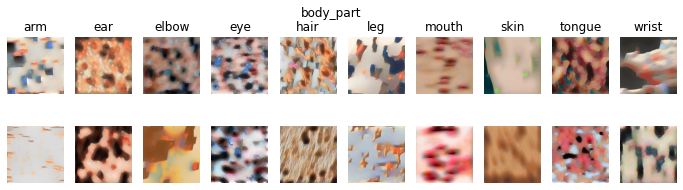

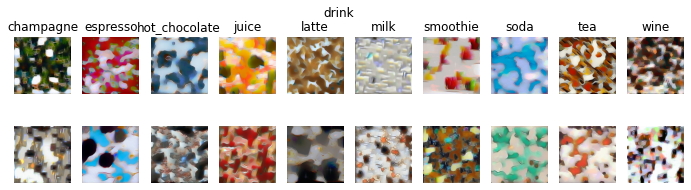

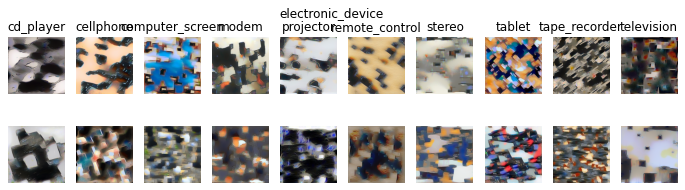

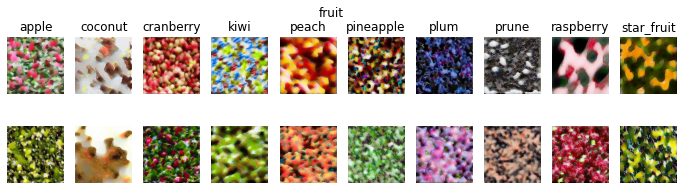

...

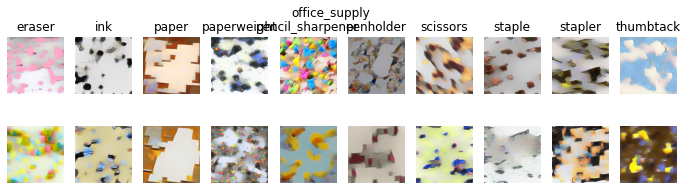

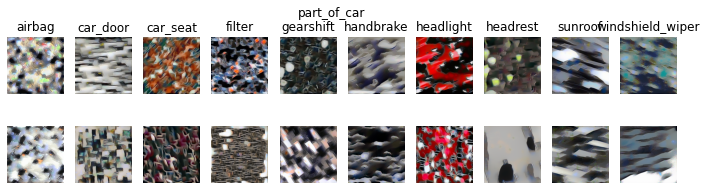

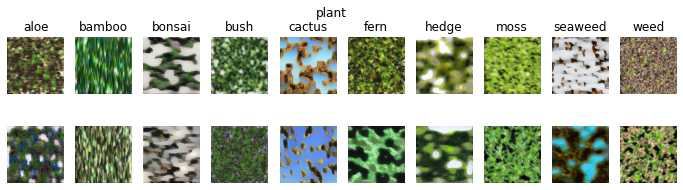

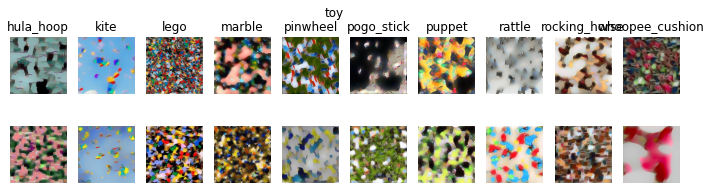

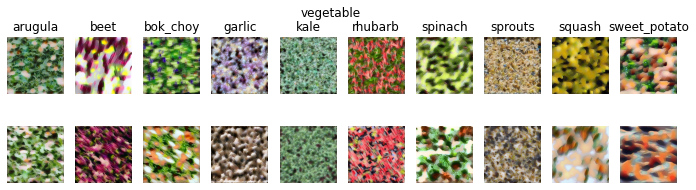

In [29]:
image_type_names = np.array(['intact', 'match pool1', 'match pool2', 'match pool3', 'match pool4'])

ii = 1;

n_ex = 2;

# for cbi in [0]:
    # supcat_names = super_names_eachset[cbi]
for cbi, supcat_names in enumerate(super_names_eachset):
    
    # print(supcat_names)
    
    info = info_eachset[cbi]
    basic_names = basic_names_eachset[cbi]
    
        
    # for sc in [0]:
        # scname = supcat_names[sc]
    for sc, scname in enumerate(supcat_names):

        plt.figure(figsize=(12,3))
    
        pi=0;
        
        for ee in range(n_ex):

            for bb, bbname in enumerate(basic_names[sc]):

                inds_use = (info['super_name']==scname) & \
                            (info['basic_name']==bbname) & \
                            (info['image_type_num']==ii)
                inds_use = np.where(inds_use)[0]

                assert(len(inds_use)==n_ex)

                ind_use = inds_use[ee]
                
                
                image_fn = np.array(info['image_path_full'])[ind_use]
                # print(image_fn)
                im = PIL.Image.open(image_fn)
                
                pi+=1
                
                plt.subplot(n_ex, n_bascat, pi)
                plt.imshow(im)
                plt.axis('off')
                
                if ee==0:
                    plt.title(bbname)
                
        plt.suptitle(scname)

In [30]:
np.array(info['image_path_full'])[ind_use]

'/user_data/mmhender/stimuli/featsynth/images_v1/sweet_potato_03s/grid5_1x1_upto_pool1.png'

In [31]:
info['image_path_full'][ind_use]

'/user_data/mmhender/stimuli/featsynth/images_v1/sweet_potato_03s/grid5_1x1_upto_pool1.png'

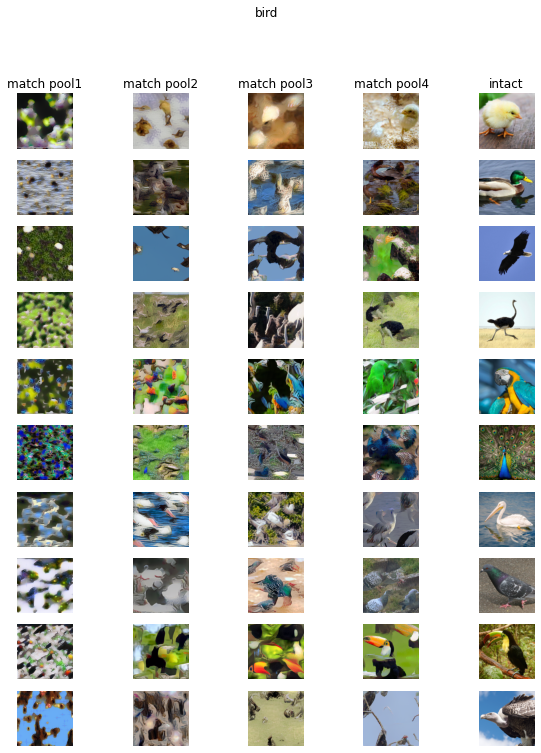

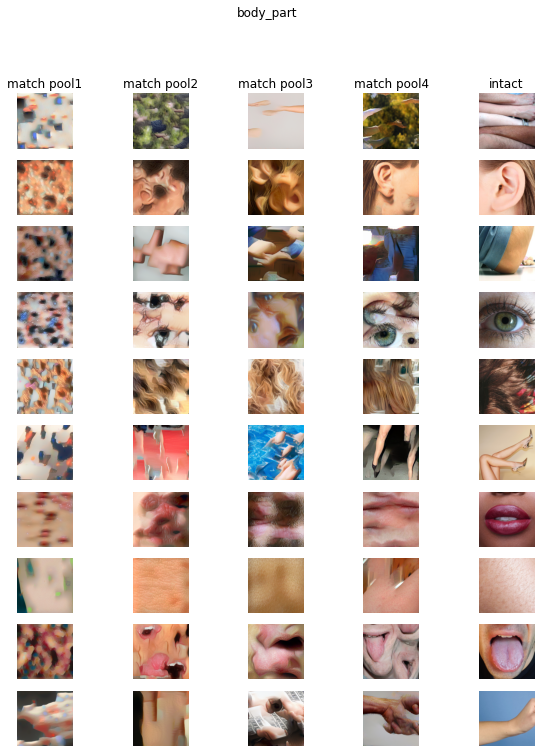

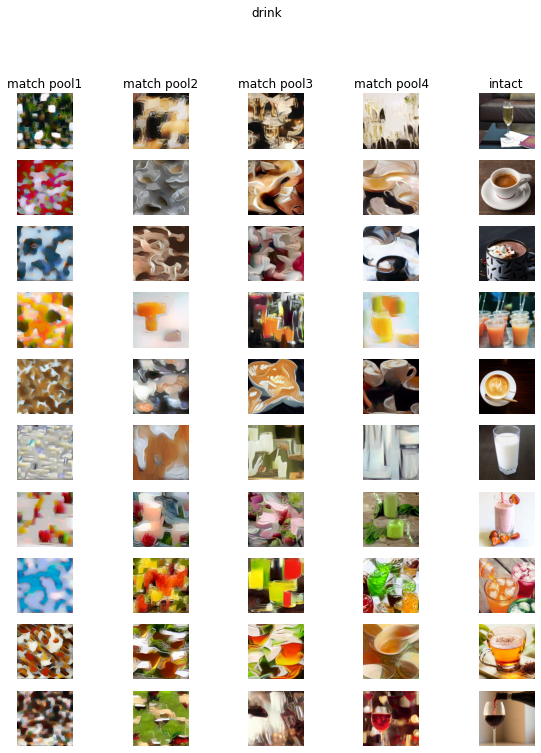

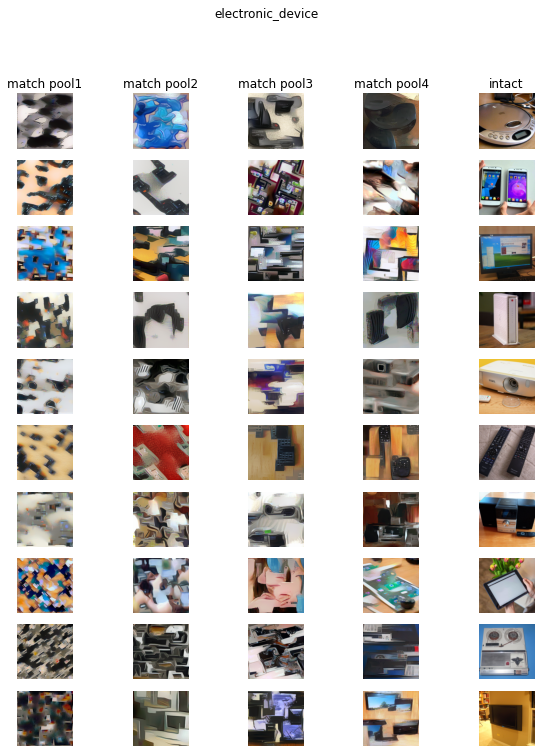

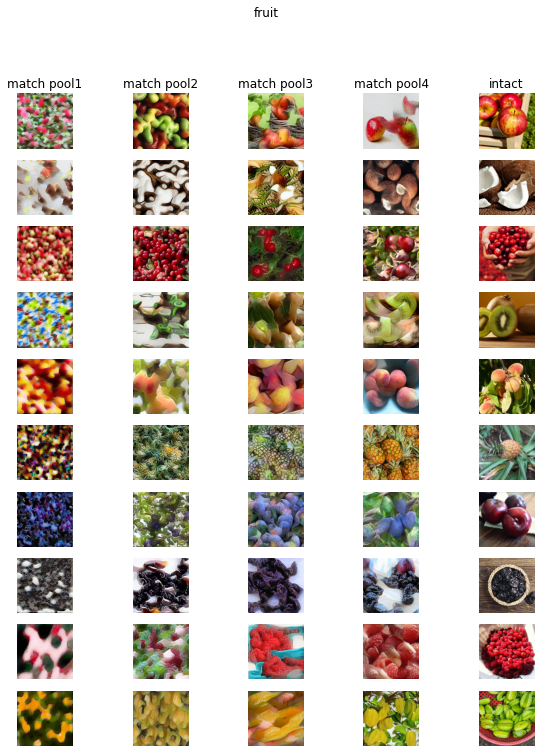

...

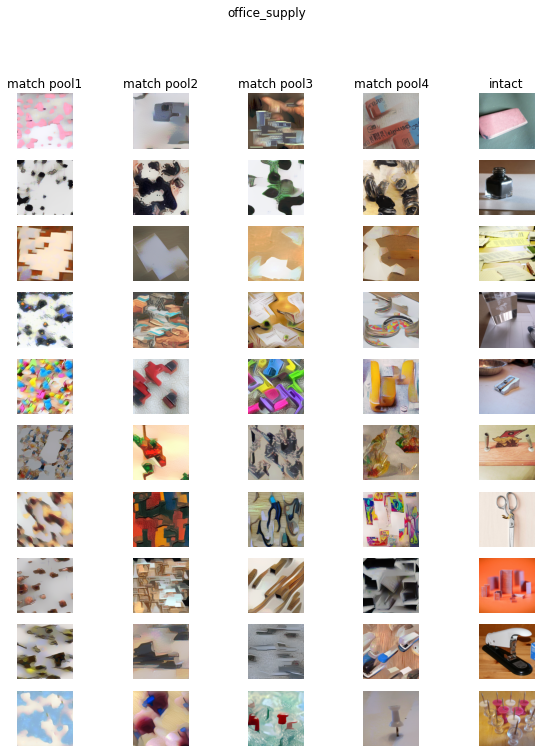

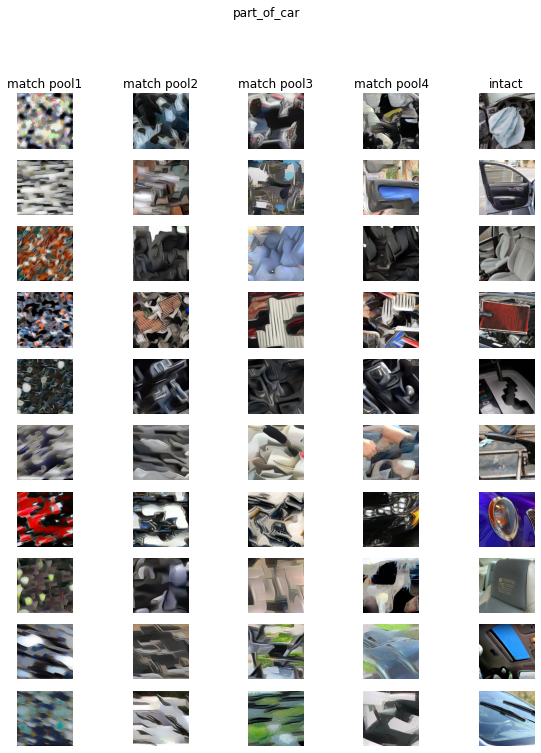

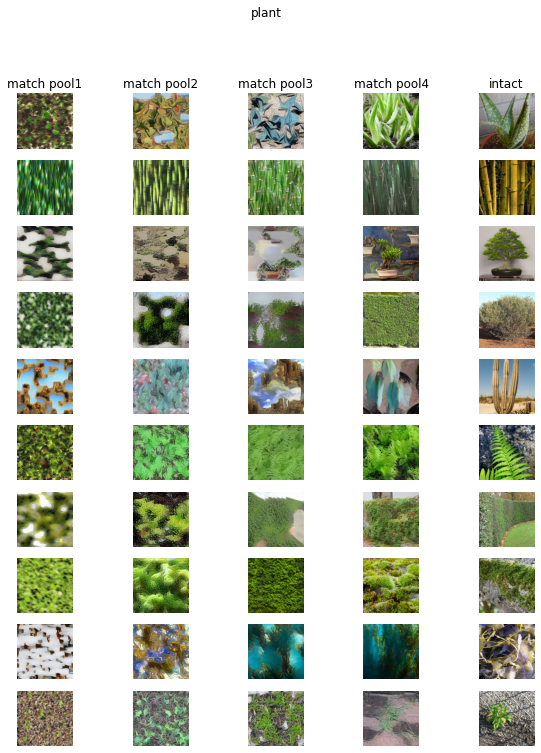

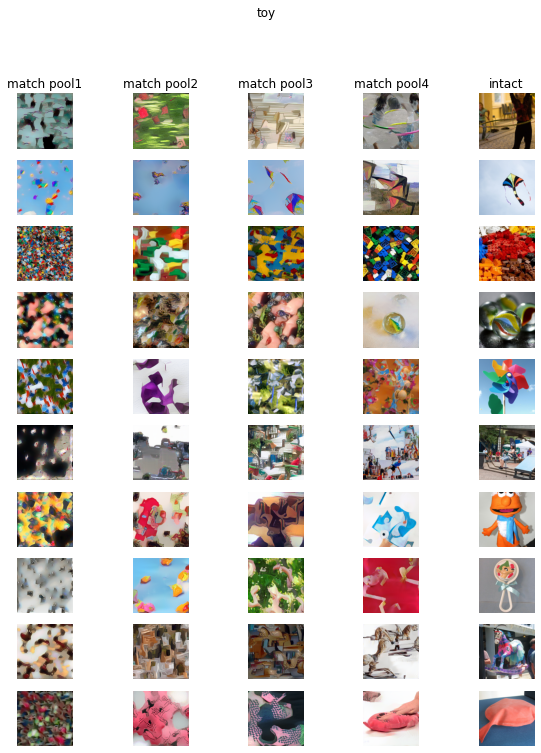

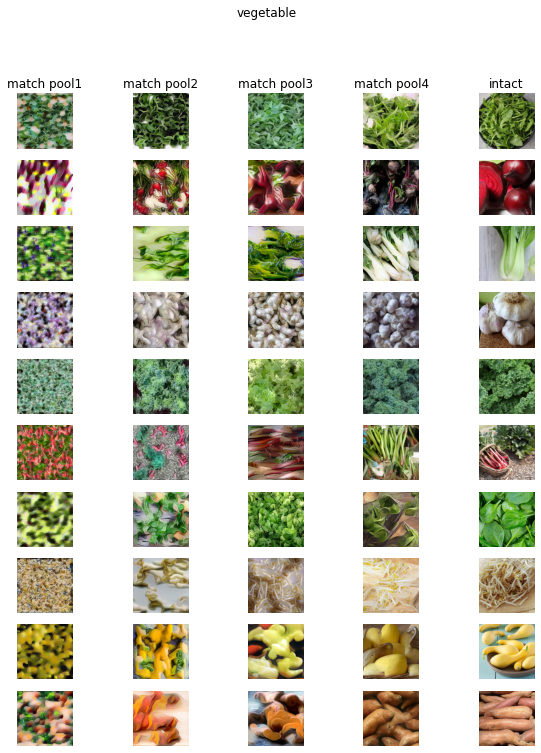

In [32]:
image_type_names = np.array(['intact', 'match pool1', 'match pool2', 'match pool3', 'match pool4'])

type_order_plot = [1,2,3,4,0]

# for cbi in [0]:
    # supcat_names = super_names_eachset[cbi]
for cbi, supcat_names in enumerate(super_names_eachset):
    
    # print(supcat_names)
    
    info = info_eachset[cbi]
    basic_names = basic_names_eachset[cbi]
    
    # for sc in [0]:
        # scname = supcat_names[sc]
    for sc, scname in enumerate(supcat_names):
        
        plt.figure(figsize=(10,12))
        
        pi=0;
        
        for bb, bbname in enumerate(basic_names[sc]):
            
            for ii in type_order_plot:

                ind_use = (info['super_name']==scname) & \
                            (info['basic_name']==bbname) & \
                            (info['image_type_num']==ii)

                image_fn = np.array(info['image_path_full'])[ind_use][0]
                im = PIL.Image.open(image_fn)
                
                pi+=1
                
                plt.subplot(n_bascat, n_image_types, pi)
                plt.imshow(im)
                plt.axis('off')
                
                if bb==0:
                    plt.title(image_type_names[ii])
                
        plt.suptitle(scname)